# Segmentation

In [17]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261", "param_t" : "#999999", "param_z" : "#A7C7E7"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa",
    "param_t": "Parametric t",
    "param_z": "Parametric z"
}

metrics = ["dsc", "iou", "nsd", "boundary_iou", "cldice", "assd", "masd", "hd", "hd_perc"]
summary_statistics = ["mean", "std", "trimmed_mean", "median", "iqr_length"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(summary_statistics), len(metrics), figsize=(6*size_factor*len(metrics), 4.5*len(summary_statistics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx1, summary_statistic in enumerate(summary_statistics):
    for idx2, metric in enumerate(metrics):
        ax = axs[idx1][idx2]
        df_all = pd.read_csv(f"results_metrics_segm/aggregated_results_{metric}_{summary_statistic}.csv").drop(columns=['Unnamed: 0'])
        methods = [c[6:] for c in df_all.columns if "width" in c]
        preferred = [m for m in preferred_order if m in methods]
        others = sorted([m for m in methods if m not in preferred_order])

        methods = preferred+others

        ax.hlines(np.arange(0, 1.01, 0.05), 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

        arrow_legend_down = False
        arrow_legend_up = False
        for i, n in enumerate(np.sort(df_all["n"].unique())):
            for j, method in enumerate(methods):
                coverages = df_all[df_all["n"]==n][f"contains_true_stat_{method}"]
                pos = (len(methods)+2)*i+j
                ax.boxplot(coverages, positions=[pos], widths=0.8, patch_artist=True,
                            boxprops=dict(facecolor=colors[method]),
                            flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                            markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                            medianprops=dict(color="white"), sym=colors[method])

                count_below = (coverages < 0.5).sum()
                if count_below > 0:
                    arrow_legend_down = True
                    triangle = mpatches.Polygon(
                        [[pos, 0.49], [pos - 0.25, 0.5], [pos + 0.25, 0.5]],
                        closed=True,
                        facecolor=colors[method],
                        edgecolor='black',
                        alpha=0.8,
                        zorder=10
                    )
                    ax.add_patch(triangle)
                    ax.text(pos, 0.502, f'{count_below}',
                            ha='center', fontsize=3*size_factor, color=colors[method], 
                            bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

                count_above = (coverages > 0.995).sum()
                if count_above > 0:
                    arrow_legend_up = True
                    triangle = mpatches.Polygon(
                        [[pos, 1.01], [pos - 0.25, 1], [pos + 0.25, 1]],
                        closed=True,
                        facecolor=colors[method],
                        edgecolor='black',
                        alpha=0.8,
                        zorder=10
                    )
                    ax.add_patch(triangle)
                    ax.text(pos, 1.012, f'{count_above}',
                            ha='center', fontsize=3*size_factor, color=colors[method],
                            bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

        legend_handles_ax1 = [
            mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
        ]
        if arrow_legend_down:
            arrow_handle = Line2D([0], [0], color='black', marker='v', linestyle='None', alpha=0.5, markersize=7*size_factor,
                                markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count below \n50% coverage')
            legend_handles_ax1.append(arrow_handle)
        if arrow_legend_up:
            circle_handle = Line2D([0], [0], color='black', marker='^', linestyle='None', alpha=0.5, markersize=7*size_factor,
                                    markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count above \n99.5% coverage')
            legend_handles_ax1.append(circle_handle)

        ax.set_ylabel(summary_statistic.upper(), weight="bold")
        ax.set_xlabel("Sample size", weight="bold")
        ax.set_ylim(0.49, 1.02)
        ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
        ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
        ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
        ax.set_yticks(np.arange(0.5, 1.01, 0.05))
        ax.set_yticklabels((np.arange(0.5, 1.01, 0.05)*100).astype(int))
        ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
        ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/coverages_segm.pdf")
plt.show()

In [18]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261", "param_t" : "#999999", "param_z" : "#A7C7E7"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa",
    "param_t": "Parametric t",
    "param_z": "Parametric z"
}

metrics = ["dsc", "iou", "nsd", "boundary_iou", "cldice", "assd", "masd", "hd", "hd_perc"]
summary_statistics = ["mean", "std", "trimmed_mean", "median", "iqr_length"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(summary_statistics), len(metrics), figsize=(6*size_factor*len(metrics), 4.5*len(summary_statistics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx1, summary_statistic in enumerate(summary_statistics):
    for idx2, metric in enumerate(metrics):
        ax = axs[idx1][idx2]
        df_all = pd.read_csv(f"results_metrics_segm/aggregated_results_{metric}_{summary_statistic}.csv").drop(columns=['Unnamed: 0'])
        methods = [c[6:] for c in df_all.columns if "width" in c]
        preferred = [m for m in preferred_order if m in methods]
        others = sorted([m for m in methods if m not in preferred_order])

        methods = preferred+others

        arrow_legend_down = False
        arrow_legend_up = False
        for i, n in enumerate(np.sort(df_all["n"].unique())):
            for j, method in enumerate(methods):
                widths = df_all[df_all["n"]==n][f"width_{method}"]
                pos = (len(methods)+2)*i+j
                ax.boxplot(widths, positions=[pos], widths=0.8, patch_artist=True,
                            boxprops=dict(facecolor=colors[method]),
                            flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                            markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                            medianprops=dict(color="white"), sym=colors[method])

        legend_handles_ax1 = [
            mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
        ]

        ax.set_ylabel(summary_statistic.upper(), weight="bold")
        ax.set_xlabel("Sample size", weight="bold")
        ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
        ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
        ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
        ax.grid(axis="y")
        ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
        ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/widths_segm.pdf")
plt.show()

# Classification

## Micro

### With stupid classifiers

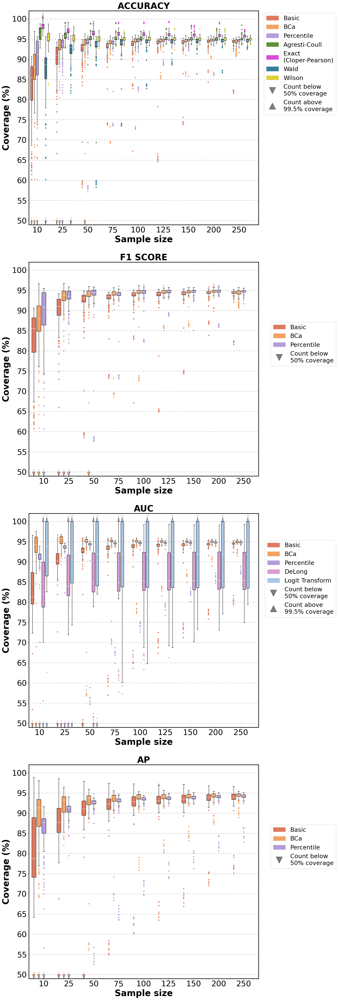

In [19]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261", "delong" : "#DA9CD1", "logit_transform" : "#A7C7E7",
          "wilson" : "#DFCF3E", "agresti_coull" : "#5D9336", "exact" : "#DB4ADB", "wald" : "#367F9C"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa",
    "delong": "DeLong",
    "logit_transform": "Logit Transform",
    "wilson": "Wilson",
    "agresti_coull" : "Agresti-Coull",
    "exact" : "Exact \n(Cloper-Pearson)",
    "wald" : 'Wald'
}
metrics = ["accuracy", "f1_score", "auc", "ap"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs[idx]
    df_all = pd.read_csv(f"results_metrics_classif/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])
    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    ax.hlines(np.arange(0, 1.01, 0.05), 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    arrow_legend_down = False
    arrow_legend_up = False
    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            coverages = df_all[df_all["n"]==n][f"contains_true_stat_{method}"]
            pos = (len(methods)+2)*i+j
            ax.boxplot(coverages, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (coverages < 0.5).sum()
            if count_below > 0:
                arrow_legend_down = True
                triangle = mpatches.Polygon(
                    [[pos, 0.49], [pos - 0.25, 0.5], [pos + 0.25, 0.5]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 0.502, f'{count_below}',
                        ha='center', fontsize=3*size_factor, color=colors[method], 
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

            count_above = (coverages > 0.995).sum()
            if count_above > 0:
                arrow_legend_up = True
                triangle = mpatches.Polygon(
                    [[pos, 1.01], [pos - 0.25, 1], [pos + 0.25, 1]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 1.012, f'{count_above}',
                        ha='center', fontsize=3*size_factor, color=colors[method],
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]
    if arrow_legend_down:
        arrow_handle = Line2D([0], [0], color='black', marker='v', linestyle='None', alpha=0.5, markersize=7*size_factor,
                               markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count below \n50% coverage')
        legend_handles_ax1.append(arrow_handle)
    if arrow_legend_up:
        circle_handle = Line2D([0], [0], color='black', marker='^', linestyle='None', alpha=0.5, markersize=7*size_factor,
                                markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count above \n99.5% coverage')
        legend_handles_ax1.append(circle_handle)

    ax.set_ylabel("Coverage (%)", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(0.49, 1.02)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(np.arange(0.5, 1.01, 0.05))
    ax.set_yticklabels((np.arange(0.5, 1.01, 0.05)*100).astype(int))
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/coverages_classif_micro.pdf")
plt.show()

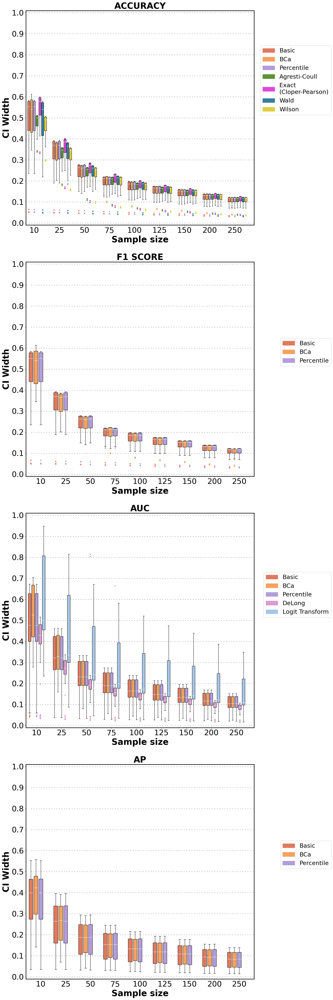

In [20]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261", "delong" : "#DA9CD1", "logit_transform" : "#A7C7E7",
          "wilson" : "#DFCF3E", "agresti_coull" : "#5D9336", "exact" : "#DB4ADB", "wald" : "#367F9C"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa",
    "delong": "DeLong",
    "logit_transform": "Logit Transform",
    "wilson": "Wilson",
    "agresti_coull" : "Agresti-Coull",
    "exact" : "Exact \n(Cloper-Pearson)",
    "wald" : 'Wald'
}
metrics = ["accuracy", "f1_score", "auc", "ap"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs[idx]
    df_all = pd.read_csv(f"results_metrics_classif/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])
    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    y_ticks = np.round(np.arange(0,1.01,0.1),1)
    if metric == "mcc":
        y_ticks*=2

    ax.hlines(y_ticks, 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            widths = df_all[df_all["n"]==n][f"width_{method}"].fillna(0)
            pos = (len(methods)+2)*i+j
            ax.boxplot(widths, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (widths < 0.5).sum()

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]

    ax.set_ylabel("CI Width", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(-0.01, np.max(y_ticks)+0.01)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_ticks)
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/width_classif_micro.pdf")
plt.show()

### Without stupid classifiers

In [21]:
import pandas as pd

df_mcc = pd.read_csv(f"results_metrics_classif/aggregated_results_mcc.csv").drop(columns=['Unnamed: 0'])

stupid_classif_df = df_mcc[df_mcc["true_value"]==0][["subtask", "alg_name"]].drop_duplicates()

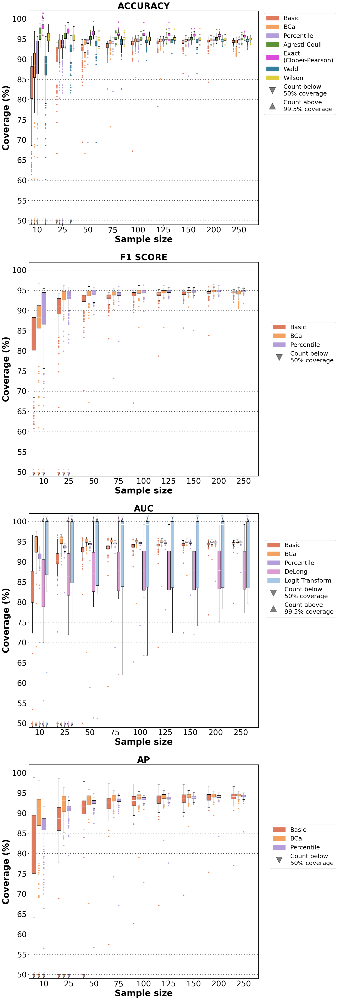

In [22]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261", "delong" : "#DA9CD1", "logit_transform" : "#A7C7E7",
          "wilson" : "#DFCF3E", "agresti_coull" : "#5D9336", "exact" : "#DB4ADB", "wald" : "#367F9C"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa",
    "delong": "DeLong",
    "logit_transform": "Logit Transform",
    "wilson": "Wilson",
    "agresti_coull" : "Agresti-Coull",
    "exact" : "Exact \n(Cloper-Pearson)",
    "wald" : 'Wald'
}
metrics = ["accuracy", "f1_score", "auc", "ap"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs[idx]
    df_all = pd.read_csv(f"results_metrics_classif/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])

    # Remove matching rows
    df_filtered = df_all.merge(stupid_classif_df, on=['subtask', 'alg_name'], how='left', indicator=True)
    df_all = df_filtered[df_filtered['_merge'] == 'left_only'].drop(columns=['_merge'])

    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    ax.hlines(np.arange(0, 1.01, 0.05), 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    arrow_legend_down = False
    arrow_legend_up = False
    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            coverages = df_all[df_all["n"]==n][f"contains_true_stat_{method}"]
            pos = (len(methods)+2)*i+j
            ax.boxplot(coverages, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (coverages < 0.5).sum()
            if count_below > 0:
                arrow_legend_down = True
                triangle = mpatches.Polygon(
                    [[pos, 0.49], [pos - 0.25, 0.5], [pos + 0.25, 0.5]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 0.502, f'{count_below}',
                        ha='center', fontsize=3*size_factor, color=colors[method], 
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

            count_above = (coverages > 0.995).sum()
            if count_above > 0:
                arrow_legend_up = True
                triangle = mpatches.Polygon(
                    [[pos, 1.01], [pos - 0.25, 1], [pos + 0.25, 1]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 1.012, f'{count_above}',
                        ha='center', fontsize=3*size_factor, color=colors[method],
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]
    if arrow_legend_down:
        arrow_handle = Line2D([0], [0], color='black', marker='v', linestyle='None', alpha=0.5, markersize=7*size_factor,
                               markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count below \n50% coverage')
        legend_handles_ax1.append(arrow_handle)
    if arrow_legend_up:
        circle_handle = Line2D([0], [0], color='black', marker='^', linestyle='None', alpha=0.5, markersize=7*size_factor,
                                markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count above \n99.5% coverage')
        legend_handles_ax1.append(circle_handle)

    ax.set_ylabel("Coverage (%)", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(0.49, 1.02)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(np.arange(0.5, 1.01, 0.05))
    ax.set_yticklabels((np.arange(0.5, 1.01, 0.05)*100).astype(int))
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/coverages_classif_micro_no_stupid.pdf")
plt.show()

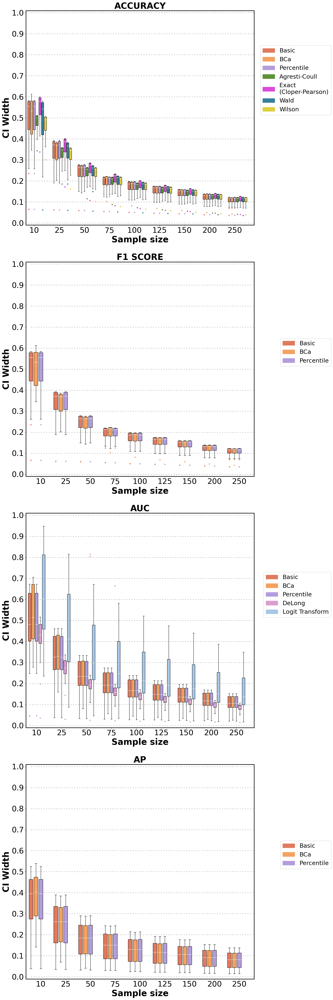

In [23]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261", "delong" : "#DA9CD1", "logit_transform" : "#A7C7E7",
          "wilson" : "#DFCF3E", "agresti_coull" : "#5D9336", "exact" : "#DB4ADB", "wald" : "#367F9C"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa",
    "delong": "DeLong",
    "logit_transform": "Logit Transform",
    "wilson": "Wilson",
    "agresti_coull" : "Agresti-Coull",
    "exact" : "Exact \n(Cloper-Pearson)",
    "wald" : 'Wald'
}
metrics = ["accuracy", "f1_score", "auc", "ap"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs[idx]
    df_all = pd.read_csv(f"results_metrics_classif/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])

    # Remove matching rows
    df_filtered = df_all.merge(stupid_classif_df, on=['subtask', 'alg_name'], how='left', indicator=True)
    df_all = df_filtered[df_filtered['_merge'] == 'left_only'].drop(columns=['_merge'])

    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    y_ticks = np.round(np.arange(0,1.01,0.1),1)
    if metric == "mcc":
        y_ticks*=2

    ax.hlines(y_ticks, 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            widths = df_all[df_all["n"]==n][f"width_{method}"].fillna(0)
            pos = (len(methods)+2)*i+j
            ax.boxplot(widths, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (widths < 0.5).sum()

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]

    ax.set_ylabel("CI Width", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(-0.01, np.max(y_ticks)+0.01)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_ticks)
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/width_classif_micro_no_stupid.pdf")
plt.show()

## Macro

### With stupid classifiers

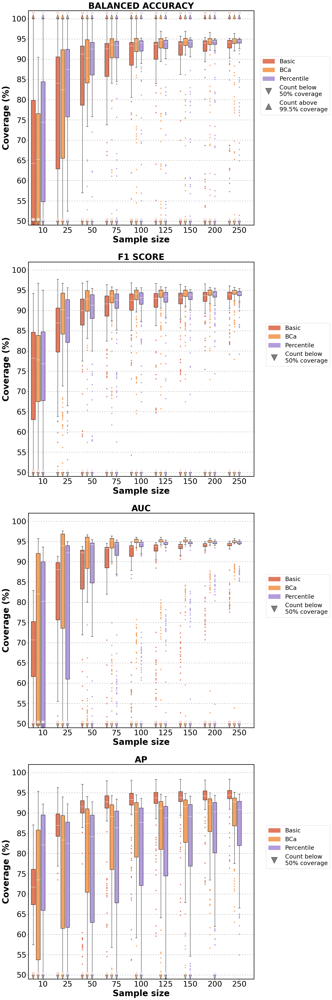

In [24]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa"
}
metrics = ["balanced_accuracy", "f1_score", "auc", "ap"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs[idx]
    df_all = pd.read_csv(f"results_metrics_classif_macro/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])
    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    ax.hlines(np.arange(0, 1.01, 0.05), 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    arrow_legend_down = False
    arrow_legend_up = False
    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            coverages = df_all[df_all["n"]==n][f"contains_true_stat_{method}"]
            pos = (len(methods)+2)*i+j
            ax.boxplot(coverages, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (coverages < 0.5).sum()
            if count_below > 0:
                arrow_legend_down = True
                triangle = mpatches.Polygon(
                    [[pos, 0.49], [pos - 0.25, 0.5], [pos + 0.25, 0.5]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 0.502, f'{count_below}',
                        ha='center', fontsize=3*size_factor, color=colors[method], 
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

            count_above = (coverages > 0.995).sum()
            if count_above > 0:
                arrow_legend_up = True
                triangle = mpatches.Polygon(
                    [[pos, 1.01], [pos - 0.25, 1], [pos + 0.25, 1]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 1.012, f'{count_above}',
                        ha='center', fontsize=3*size_factor, color=colors[method],
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]
    if arrow_legend_down:
        arrow_handle = Line2D([0], [0], color='black', marker='v', linestyle='None', alpha=0.5, markersize=7*size_factor,
                               markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count below \n50% coverage')
        legend_handles_ax1.append(arrow_handle)
    if arrow_legend_up:
        circle_handle = Line2D([0], [0], color='black', marker='^', linestyle='None', alpha=0.5, markersize=7*size_factor,
                                markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count above \n99.5% coverage')
        legend_handles_ax1.append(circle_handle)

    ax.set_ylabel("Coverage (%)", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(0.49, 1.02)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(np.arange(0.5, 1.01, 0.05))
    ax.set_yticklabels((np.arange(0.5, 1.01, 0.05)*100).astype(int))
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/coverages_classif_macro.pdf")
plt.show()

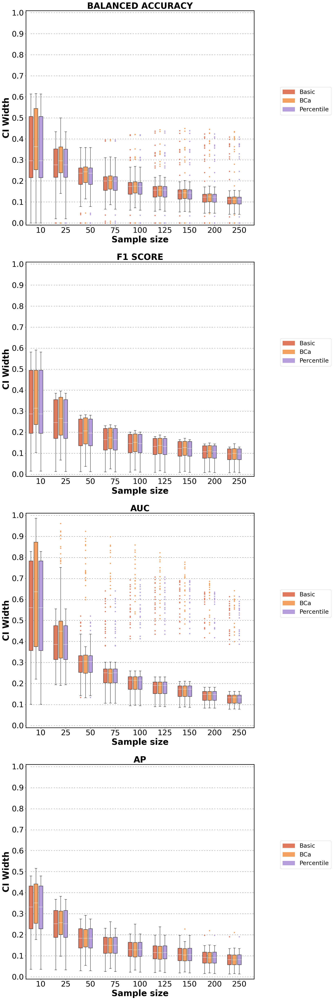

In [25]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa"
}
metrics = ["balanced_accuracy", "f1_score", "auc", "ap"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs[idx]
    df_all = pd.read_csv(f"results_metrics_classif_macro/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])
    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    y_ticks = np.round(np.arange(0,1.01,0.1),1)
    if metric == "mcc":
        y_ticks*=2

    ax.hlines(y_ticks, 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            widths = df_all[df_all["n"]==n][f"width_{method}"].fillna(0)
            pos = (len(methods)+2)*i+j
            ax.boxplot(widths, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (widths < 0.5).sum()

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]

    ax.set_ylabel("CI Width", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(-0.01, np.max(y_ticks)+0.01)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_ticks)
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/width_classif_macro.pdf")
plt.show()

### Without stupid classifiers

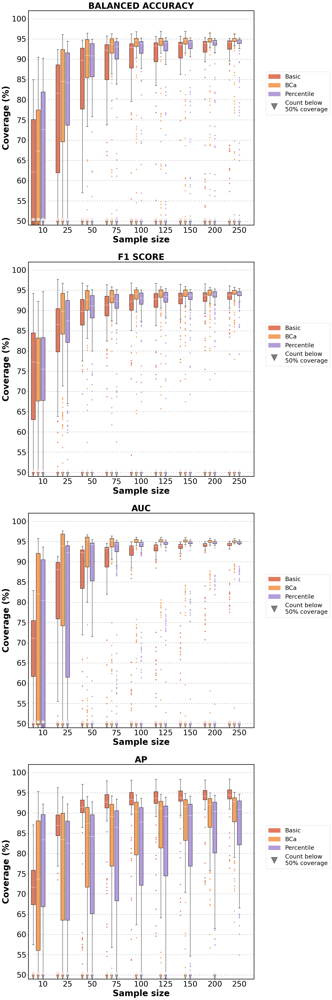

In [33]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa"
}
metrics = ["balanced_accuracy", "f1_score", "auc", "ap"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs[idx]
    df_all = pd.read_csv(f"results_metrics_classif_macro/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])

    # Remove matching rows
    df_filtered = df_all.merge(stupid_classif_df, on=['subtask', 'alg_name'], how='left', indicator=True)
    df_all = df_filtered[df_filtered['_merge'] == 'left_only'].drop(columns=['_merge'])

    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    ax.hlines(np.arange(0, 1.01, 0.05), 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    arrow_legend_down = False
    arrow_legend_up = False
    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            coverages = df_all[df_all["n"]==n][f"contains_true_stat_{method}"]
            pos = (len(methods)+2)*i+j
            ax.boxplot(coverages, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (coverages < 0.5).sum()
            if count_below > 0:
                arrow_legend_down = True
                triangle = mpatches.Polygon(
                    [[pos, 0.49], [pos - 0.25, 0.5], [pos + 0.25, 0.5]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 0.502, f'{count_below}',
                        ha='center', fontsize=3*size_factor, color=colors[method], 
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

            count_above = (coverages > 0.995).sum()
            if count_above > 0:
                arrow_legend_up = True
                triangle = mpatches.Polygon(
                    [[pos, 1.01], [pos - 0.25, 1], [pos + 0.25, 1]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 1.012, f'{count_above}',
                        ha='center', fontsize=3*size_factor, color=colors[method],
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]
    if arrow_legend_down:
        arrow_handle = Line2D([0], [0], color='black', marker='v', linestyle='None', alpha=0.5, markersize=7*size_factor,
                               markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count below \n50% coverage')
        legend_handles_ax1.append(arrow_handle)
    if arrow_legend_up:
        circle_handle = Line2D([0], [0], color='black', marker='^', linestyle='None', alpha=0.5, markersize=7*size_factor,
                                markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count above \n99.5% coverage')
        legend_handles_ax1.append(circle_handle)

    ax.set_ylabel("Coverage (%)", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(0.49, 1.02)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(np.arange(0.5, 1.01, 0.05))
    ax.set_yticklabels((np.arange(0.5, 1.01, 0.05)*100).astype(int))
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/coverages_classif_macro_no_stupid.pdf")
plt.show()

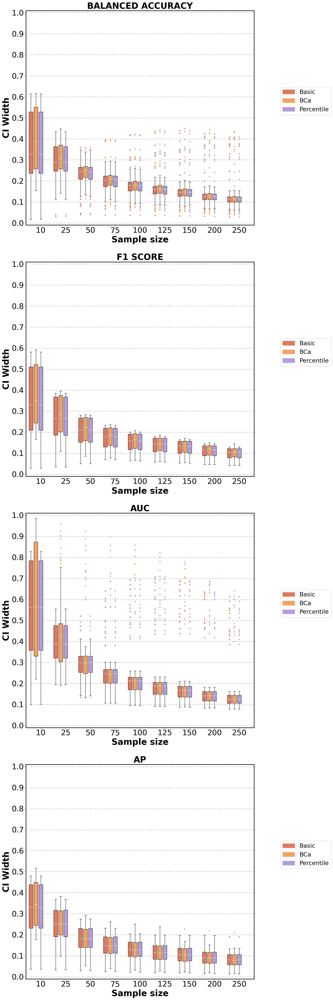

In [27]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa"
}
metrics = ["balanced_accuracy", "f1_score", "auc", "ap"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs[idx]
    df_all = pd.read_csv(f"results_metrics_classif_macro/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])

    # Remove matching rows
    df_filtered = df_all.merge(stupid_classif_df, on=['subtask', 'alg_name'], how='left', indicator=True)
    df_all = df_filtered[df_filtered['_merge'] == 'left_only'].drop(columns=['_merge'])

    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    y_ticks = np.round(np.arange(0,1.01,0.1),1)
    if metric == "mcc":
        y_ticks*=2

    ax.hlines(y_ticks, 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            widths = df_all[df_all["n"]==n][f"width_{method}"].fillna(0)
            pos = (len(methods)+2)*i+j
            ax.boxplot(widths, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (widths < 0.5).sum()

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]

    ax.set_ylabel("CI Width", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(-0.01, np.max(y_ticks)+0.01)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_ticks)
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/width_classif_macro_no_stupid.pdf")
plt.show()

## MCC

### With stupid classifiers

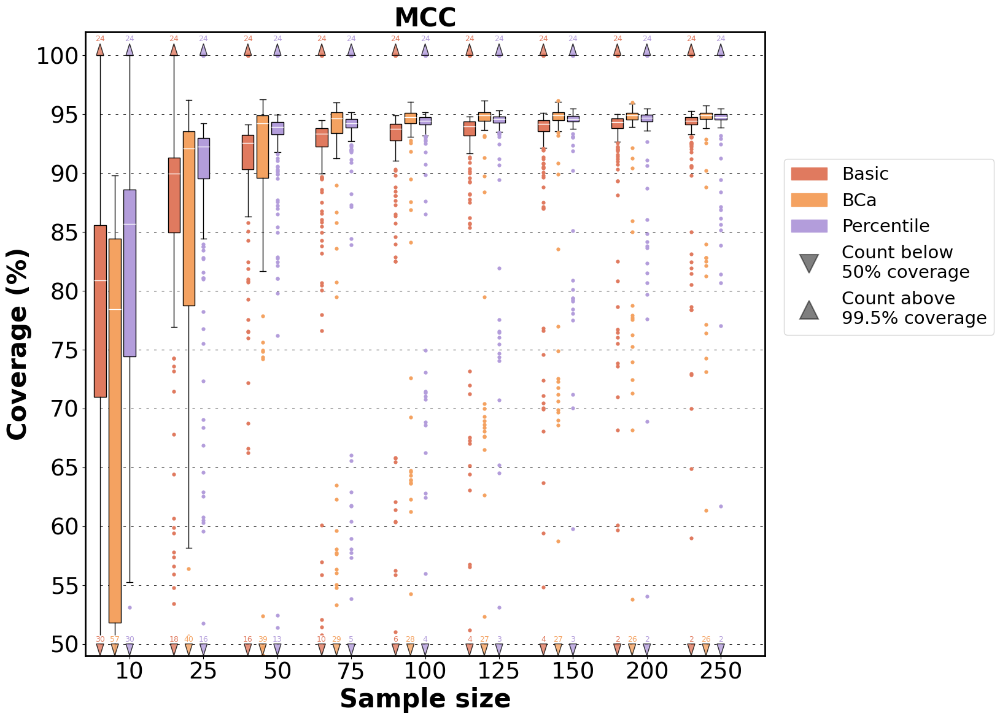

In [28]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa"
}
metrics = ["mcc"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs
    df_all = pd.read_csv(f"results_metrics_classif/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])
    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    ax.hlines(np.arange(0, 1.01, 0.05), 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    arrow_legend_down = False
    arrow_legend_up = False
    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            coverages = df_all[df_all["n"]==n][f"contains_true_stat_{method}"]
            pos = (len(methods)+2)*i+j
            ax.boxplot(coverages, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (coverages < 0.5).sum()
            if count_below > 0:
                arrow_legend_down = True
                triangle = mpatches.Polygon(
                    [[pos, 0.49], [pos - 0.25, 0.5], [pos + 0.25, 0.5]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 0.502, f'{count_below}',
                        ha='center', fontsize=3*size_factor, color=colors[method], 
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

            count_above = (coverages > 0.995).sum()
            if count_above > 0:
                arrow_legend_up = True
                triangle = mpatches.Polygon(
                    [[pos, 1.01], [pos - 0.25, 1], [pos + 0.25, 1]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 1.012, f'{count_above}',
                        ha='center', fontsize=3*size_factor, color=colors[method],
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]
    if arrow_legend_down:
        arrow_handle = Line2D([0], [0], color='black', marker='v', linestyle='None', alpha=0.5, markersize=7*size_factor,
                               markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count below \n50% coverage')
        legend_handles_ax1.append(arrow_handle)
    if arrow_legend_up:
        circle_handle = Line2D([0], [0], color='black', marker='^', linestyle='None', alpha=0.5, markersize=7*size_factor,
                                markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count above \n99.5% coverage')
        legend_handles_ax1.append(circle_handle)

    ax.set_ylabel("Coverage (%)", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(0.49, 1.02)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(np.arange(0.5, 1.01, 0.05))
    ax.set_yticklabels((np.arange(0.5, 1.01, 0.05)*100).astype(int))
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/coverages_classif_mcc.pdf")
plt.show()

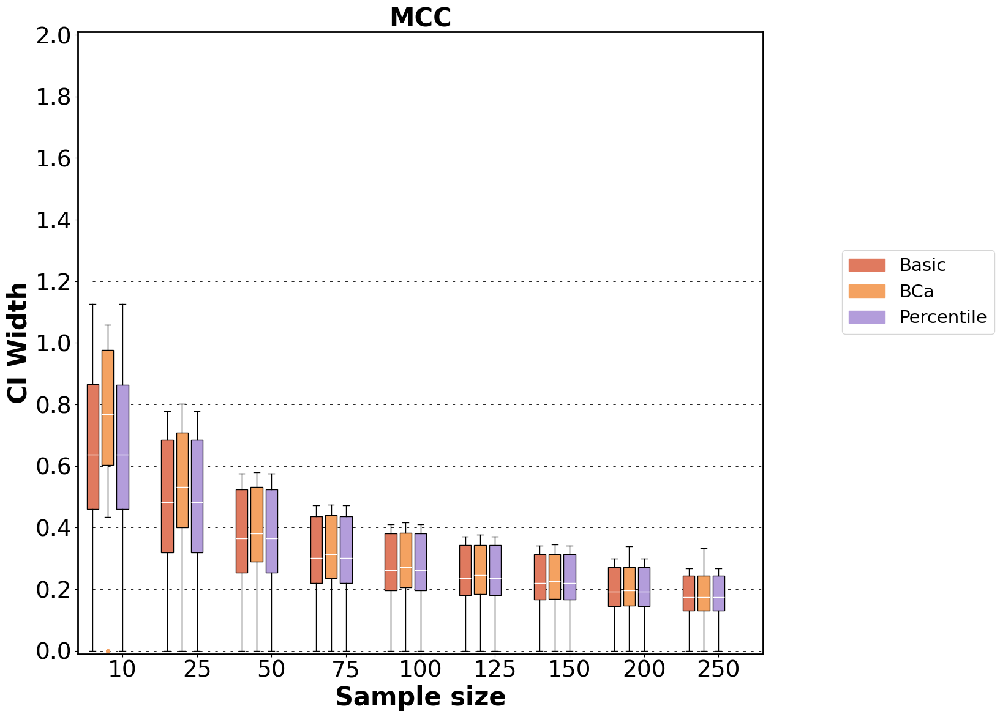

In [29]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa"
}
metrics = ["mcc"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs
    df_all = pd.read_csv(f"results_metrics_classif/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])
    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    y_ticks = np.round(np.arange(0,1.01,0.1),1)
    if metric == "mcc":
        y_ticks*=2

    ax.hlines(y_ticks, 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            widths = df_all[df_all["n"]==n][f"width_{method}"].fillna(0)
            pos = (len(methods)+2)*i+j
            ax.boxplot(widths, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (widths < 0.5).sum()

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]

    ax.set_ylabel("CI Width", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(-0.01, np.max(y_ticks)+0.01)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_ticks)
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/width_classif_mcc.pdf")
plt.show()

### Without stupid classifiers

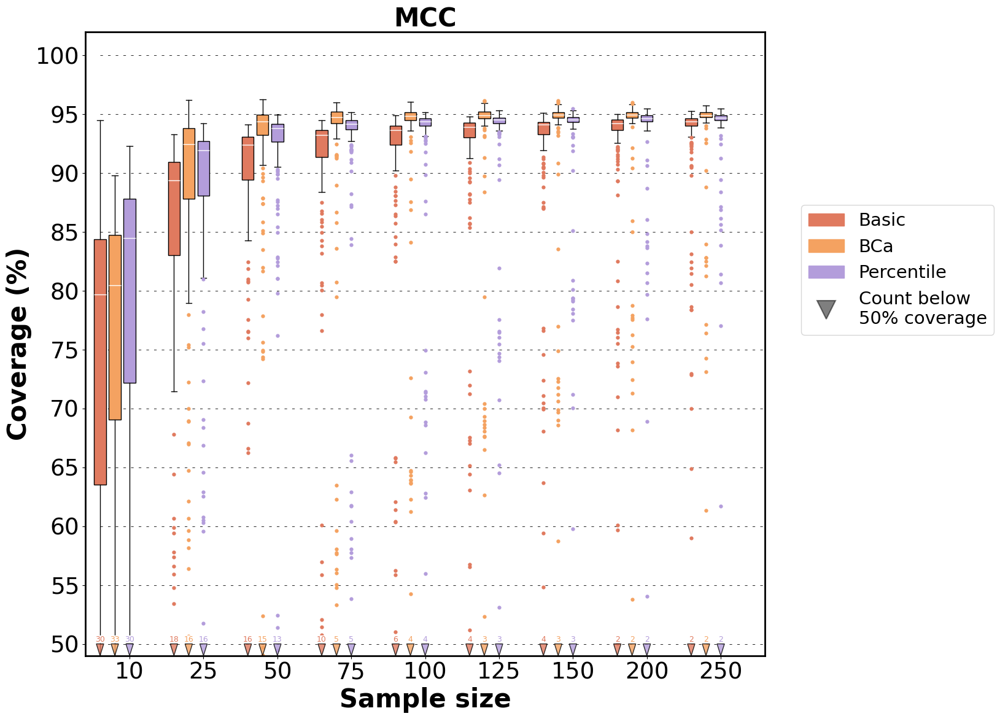

In [30]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa"
}
metrics = ["mcc"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs
    df_all = pd.read_csv(f"results_metrics_classif/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])

    # Remove matching rows
    df_filtered = df_all.merge(stupid_classif_df, on=['subtask', 'alg_name'], how='left', indicator=True)
    df_all = df_filtered[df_filtered['_merge'] == 'left_only'].drop(columns=['_merge'])

    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    ax.hlines(np.arange(0, 1.01, 0.05), 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    arrow_legend_down = False
    arrow_legend_up = False
    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            coverages = df_all[df_all["n"]==n][f"contains_true_stat_{method}"]
            pos = (len(methods)+2)*i+j
            ax.boxplot(coverages, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (coverages < 0.5).sum()
            if count_below > 0:
                arrow_legend_down = True
                triangle = mpatches.Polygon(
                    [[pos, 0.49], [pos - 0.25, 0.5], [pos + 0.25, 0.5]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 0.502, f'{count_below}',
                        ha='center', fontsize=3*size_factor, color=colors[method], 
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

            count_above = (coverages > 0.995).sum()
            if count_above > 0:
                arrow_legend_up = True
                triangle = mpatches.Polygon(
                    [[pos, 1.01], [pos - 0.25, 1], [pos + 0.25, 1]],
                    closed=True,
                    facecolor=colors[method],
                    edgecolor='black',
                    alpha=0.8,
                    zorder=10
                )
                ax.add_patch(triangle)
                ax.text(pos, 1.012, f'{count_above}',
                        ha='center', fontsize=3*size_factor, color=colors[method],
                        bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.'))

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]
    if arrow_legend_down:
        arrow_handle = Line2D([0], [0], color='black', marker='v', linestyle='None', alpha=0.5, markersize=7*size_factor,
                               markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count below \n50% coverage')
        legend_handles_ax1.append(arrow_handle)
    if arrow_legend_up:
        circle_handle = Line2D([0], [0], color='black', marker='^', linestyle='None', alpha=0.5, markersize=7*size_factor,
                                markeredgecolor="black", markeredgewidth=0.5*size_factor, label='Count above \n99.5% coverage')
        legend_handles_ax1.append(circle_handle)

    ax.set_ylabel("Coverage (%)", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(0.49, 1.02)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(np.arange(0.5, 1.01, 0.05))
    ax.set_yticklabels((np.arange(0.5, 1.01, 0.05)*100).astype(int))
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/coverages_classif_mcc_no_stupid.pdf")
plt.show()

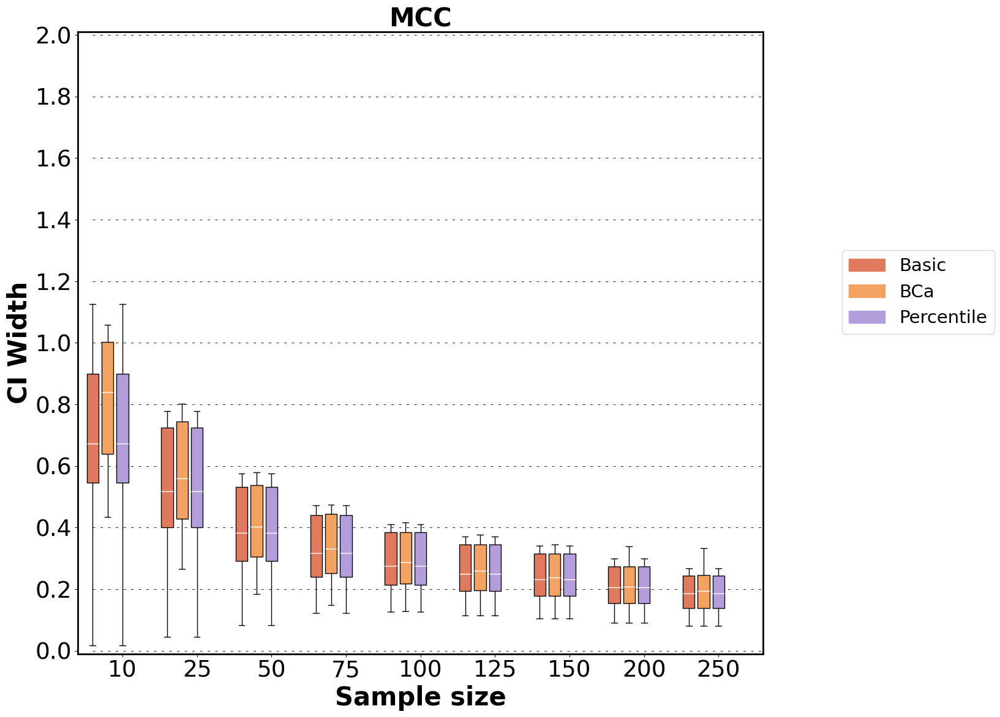

In [31]:
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

colors = {"basic": "#E07A5F", "percentile": "#B39DDB", "bca" : "#F4A261"}

labels = {
    "basic": "Basic",
    "percentile": "Percentile",
    "bca": "BCa"
}
metrics = ["mcc"]

size_factor = 3

# Set Nature-style: clean, minimal, sans-serif, no grid, no top/right spines
plt.rcParams.update({
    "font.family": "sans-serif",
    "font.size": 10*size_factor,
    "axes.titlesize": 10*size_factor,
    "axes.labelsize": 10*size_factor,
    "xtick.labelsize": 9*size_factor,
    "ytick.labelsize": 9*size_factor,
    "legend.fontsize": 7*size_factor,
    "axes.edgecolor": "black",
    "axes.linewidth": 2,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.grid": False,
    "xtick.direction": "out",
    "ytick.direction": "out",
    "figure.facecolor": "white",
    "axes.facecolor": "white"
})

fig, axs = plt.subplots(len(metrics), 1, figsize=(6*size_factor, 4.5*len(metrics)*size_factor))

preferred_order = ["basic", "bca", "percentile"]
for idx, metric in enumerate(metrics):
    ax = axs
    df_all = pd.read_csv(f"results_metrics_classif/aggregated_results_{metric}.csv").drop(columns=['Unnamed: 0'])

    # Remove matching rows
    df_filtered = df_all.merge(stupid_classif_df, on=['subtask', 'alg_name'], how='left', indicator=True)
    df_all = df_filtered[df_filtered['_merge'] == 'left_only'].drop(columns=['_merge'])

    methods = [c[6:] for c in df_all.columns if "width" in c]
    preferred = [m for m in preferred_order if m in methods]
    others = sorted([m for m in methods if m not in preferred_order])

    methods = preferred+others

    y_ticks = np.round(np.arange(0,1.01,0.1),1)
    if metric == "mcc":
        y_ticks*=2

    ax.hlines(y_ticks, 0, (len(methods)+2)*len(df_all["n"].unique()-2), colors="black", linewidths=0.2*size_factor, linestyles=(0, (5,10)))

    for i, n in enumerate(np.sort(df_all["n"].unique())):
        for j, method in enumerate(methods):
            widths = df_all[df_all["n"]==n][f"width_{method}"].fillna(0)
            pos = (len(methods)+2)*i+j
            ax.boxplot(widths, positions=[pos], widths=0.8, patch_artist=True,
                        boxprops=dict(facecolor=colors[method]),
                        flierprops=dict(marker='o', markersize=1*size_factor, markerfacecolor=colors[method],
                                         markeredgewidth=0.5*size_factor, markeredgecolor="black"),
                        medianprops=dict(color="white"), sym=colors[method])

            count_below = (widths < 0.5).sum()

    legend_handles_ax1 = [
        mpatches.Patch(color=colors[method], label=labels[method]) for method in methods
    ]

    ax.set_ylabel("CI Width", weight="bold")
    ax.set_xlabel("Sample size", weight="bold")
    ax.set_ylim(-0.01, np.max(y_ticks)+0.01)
    ax.set_title(f"{metric.upper()}".replace("_", " "), weight="bold")
    ax.set_xticks([(len(methods)+2)*i+2 for i in range(len(df_all["n"].unique()))])
    ax.set_xticklabels([f"{int(n)}" for n in np.sort(df_all["n"].unique())])
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_ticks)
    ax.legend(handles=legend_handles_ax1, loc="lower right", bbox_to_anchor=(1.35, 0.5))
    ax.set_xlim(-1, (len(methods)+2)*len(df_all["n"].unique()))

plt.subplots_adjust(bottom=0.15, wspace=0.2, hspace=0.4)
plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(f"clean_figs/width_classif_mcc_no_stupid.pdf")
plt.show()

In [32]:
from sklearn.metrics import average_precision_score
from CIs_Medical_Imaging.src.intervals_and_metrics import ap

# Example: Only one class present (all labels are 1)
y_true = np.array([0,0,0,0,0])
y_scores = np.array([0.9, 0.8, 0.95, 0.7, 0.85])

ap_ = ap(y_scores, y_true)
print("Average Precision (only one class present):", ap_)

Average Precision (only one class present): 0.0
